In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch

import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent
DATA_ROOT = PROJECT_ROOT / "training_data"

sys.path.append(str(PROJECT_ROOT))

print("PROJECT_ROOT =", PROJECT_ROOT)
print("DATA_ROOT    =", DATA_ROOT)

PROJECT_ROOT = /home/fmoller/Projects/LearningOrganoids/GraphNN
DATA_ROOT    = /home/fmoller/Projects/LearningOrganoids/GraphNN/training_data


In [2]:
from src.data.io import load_graph_dataset_from_dir
from src.data.metadata import load_aux_metadata_for_dir, attach_metadata_to_graphs

# Load all organoids
# data_dir = PROJECT_ROOT / "training_data" / "smooth_cryptdist"
data_dir = PROJECT_ROOT / "training_data" / "mean_curvature_smooth"


graphs = load_graph_dataset_from_dir(str(data_dir))
print(f"Loaded {len(graphs)} organoids.")
if graphs:
    print("Raw y shape:", tuple(graphs[0].y.shape))

meta = load_aux_metadata_for_dir(str(data_dir))
attach_metadata_to_graphs(graphs, meta)

Loaded 1134 graphs; skipped 0.
Loaded 1134 organoids.
Raw y shape: (265, 2)


1134

In [3]:
from src.data.io import select_graph_targets

# Gaussian curvature only, old 1D format
graphs = select_graph_targets(graphs, target_indices=0, inplace=False)

if graphs:
    print("Reduced y shape:", tuple(graphs[0].y.shape))


Reduced y shape: (265,)


In [4]:
from src.data.metadata import snapshot_graph_metadata, load_marker_names_from_dir

marker_names = load_marker_names_from_dir(data_dir)
meta_lookup = snapshot_graph_metadata(graphs)

DEFAULT_MARKER_COLORS = {
    "Lysozyme": "#2C75D2",
    "Serotonin": "#F392E3",
    "Mucin 2": "#3EC1D9",
    "Chroma": "#D852CB",
    "Glucagon": "#983EE2",
    "LGR5": "#FFB431",
    "AldoB": "#F16C6A",
    "Agr2": "#359BD5",
    "KI67": "#808080",
    "none": "#EBEBEB",
}


In [5]:
from src.data.filters import filter_graphs_by_sphericity

graphs, rejected = filter_graphs_by_sphericity(
    graphs,
    max_sphericity=0.92,
    print_summary=True,
    return_rejected=True,
)

filter_graphs_by_sphericity(max_sphericity=0.92): kept 819 / 1134 graphs

dataset          timepoint          kept  total     frac
----------------------------------------------------------
20250929         day4                244    342    0.713
20250929         day4p5               89    104    0.856
20250929         day4p5-more         290    411    0.706
20251201         day4p5              196    277    0.708


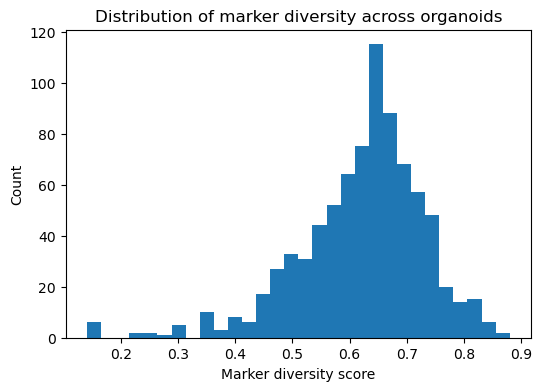

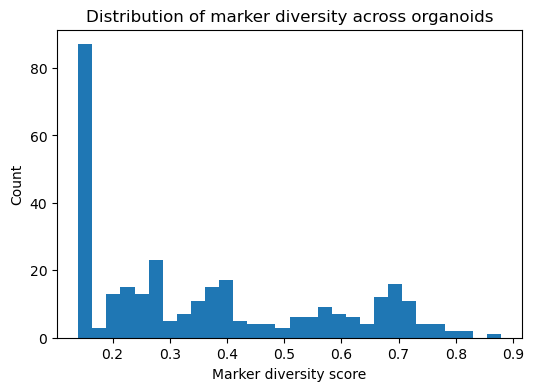

In [6]:
import matplotlib.pyplot as plt
from src.data.filters import marker_diversity_scores

# --- compute scores ---
scores_graphs = marker_diversity_scores(graphs)
scores_sphere = marker_diversity_scores(rejected)

# convert to numpy array if needed
scores_graphs = np.asarray(scores_graphs)
scores_sphere = np.asarray(scores_sphere)


# --- plot histogram ---
plt.figure(figsize=(6, 4))
plt.hist(scores_graphs, bins=30)
plt.xlabel("Marker diversity score")
plt.ylabel("Count")
plt.title("Distribution of marker diversity across organoids")
plt.show()

plt.figure(figsize=(6, 4))
plt.hist(scores_sphere, bins=30)
plt.xlabel("Marker diversity score")
plt.ylabel("Count")
plt.title("Distribution of marker diversity across organoids")
plt.show()

In [7]:
from src.plotting.mesh_plots import *

N = 10  # choose how many top-diversity organoids to inspect

top_idx = np.argsort(scores_sphere)[::-1][:N]

print("Top diversity spherical graphs:")
for rank, idx in enumerate(top_idx, start=1):
    g = rejected[idx]
    print(
        f"{rank:>2}. index={idx:<5} "
        f"score={scores_sphere[idx]:.4f} "
        f"organoid={getattr(g, 'organoid_str', None)}"
    )

for idx in top_idx:
    g = rejected[idx]

    marker_proj = project_marker_categories_for_graph(
        g,
        marker_names=marker_names,
        marker_colors=DEFAULT_MARKER_COLORS,
        meta_lookup=meta_lookup,
        missing_category="none",
    )

    fig = plot_categorical_mesh(
        marker_proj["mesh"],
        marker_proj["mesh_categories"],
        category_order=[m for m in DEFAULT_MARKER_COLORS.keys() if m != "none" and m in marker_names],
        category_colors=DEFAULT_MARKER_COLORS,
        baseline_color=DEFAULT_MARKER_COLORS.get("none", "lightgray"),
        baseline_name="none",
        add_legend=True,
        title=f"{getattr(g, 'organoid_str', None)} | diversity={scores_sphere[idx]:.4f}",
    )

    fig.show()

Top diversity spherical graphs:
 1. index=219   score=0.8789 organoid=organoid_day4p5_A06_64
 2. index=220   score=0.8204 organoid=organoid_day4p5_A06_66
 3. index=81    score=0.8204 organoid=organoid_day4_B02_18
 4. index=49    score=0.8043 organoid=organoid_day4_A05_71
 5. index=312   score=0.7933 organoid=organoid_day4p5_B06_8
 6. index=106   score=0.7783 organoid=organoid_day4p5-more_C01_137
 7. index=284   score=0.7688 organoid=organoid_day4p5_B04_92
 8. index=310   score=0.7613 organoid=organoid_day4p5_B06_73
 9. index=288   score=0.7559 organoid=organoid_day4p5_B05_22
10. index=251   score=0.7460 organoid=organoid_day4p5_B03_160
